In [2]:
import os
import shutil
import random

# Dataset directories
disease_datasets = [
    'C:\\Users\\sangeetha\\1\\alzheimer_mri'
]

# Output directory
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Splits
splits = ['train', 'test', 'val']

# Create base folders
for split in splits:
    os.makedirs(os.path.join(combined_dataset, split), exist_ok=True)

# Loop through datasets
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        if not os.path.exists(src_split_path):
            print(f"❌ Skipping {src_split_path} - not found")
            continue

        os.makedirs(dest_split_path, exist_ok=True)

        # Gather all image paths
        image_paths = []
        for root, dirs, files in os.walk(src_split_path):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    image_paths.append(os.path.join(root, file))

        # Shuffle and take 50%
        random.shuffle(image_paths)
        half_count = len(image_paths) // 4
        selected_images = image_paths[:half_count]

        print(f"Copying {half_count} images from {src_split_path}...")

        # Copy selected files
        for src_file in selected_images:
            file_name = os.path.basename(src_file)
            dest_file = os.path.join(dest_split_path, file_name)

            # Avoid overwriting
            count = 1
            while os.path.exists(dest_file):
                name, ext = os.path.splitext(file_name)
                dest_file = os.path.join(dest_split_path, f"{name}_{count}{ext}")
                count += 1

            shutil.copy(src_file, dest_file)


Copying 15126 images from C:\Users\sangeetha\1\alzheimer_mri\train...
Copying 4322 images from C:\Users\sangeetha\1\alzheimer_mri\test...
Copying 2160 images from C:\Users\sangeetha\1\alzheimer_mri\val...


In [1]:
import os
import shutil
import random

# Paths
original_dataset = 'C:\\Users\\sangeetha\\1\\brain-tumor-mri-dataset'
new_dataset = 'C:\\Users\\sangeetha\\1\\brain-tumor'
val_ratio = 0.2  # 20% for validation

# Create base directories
for split in ['train', 'test', 'val']:
    os.makedirs(os.path.join(new_dataset, split), exist_ok=True)

# Step 1: Copy test data directly
shutil.copytree(
    os.path.join(original_dataset, 'testing'),
    os.path.join(new_dataset, 'test'),
    dirs_exist_ok=True
)

# Step 2: Copy train data and create val split
train_src = os.path.join(original_dataset, 'training')
train_dst = os.path.join(new_dataset, 'train')
val_dst = os.path.join(new_dataset, 'val')

for class_name in os.listdir(train_src):
    class_train_src = os.path.join(train_src, class_name)

    if not os.path.isdir(class_train_src):
        continue

    # Create class folders in new train and val directories
    class_train_dst = os.path.join(train_dst, class_name)
    class_val_dst = os.path.join(val_dst, class_name)
    os.makedirs(class_train_dst, exist_ok=True)
    os.makedirs(class_val_dst, exist_ok=True)

    # List image files and shuffle
    images = [f for f in os.listdir(class_train_src) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(images)

    val_count = int(len(images) * val_ratio)

    # Copy val images
    for img in images[:val_count]:
        src = os.path.join(class_train_src, img)
        dst = os.path.join(class_val_dst, img)
        shutil.copy(src, dst)

    # Copy remaining to train
    for img in images[val_count:]:
        src = os.path.join(class_train_src, img)
        dst = os.path.join(class_train_dst, img)
        shutil.copy(src, dst)

print("✅ New dataset folder created with train, test, and val splits.")


✅ New dataset folder created with train, test, and val splits.


In [4]:
import os
import shutil

# List of disease dataset folders (replace with your actual paths)
disease_datasets = [
    'C:\\Users\\sangeetha\\1\\alzheimer_mri',
    'C:\\Users\\sangeetha\\1\\bone',
    'C:\\Users\\sangeetha\\1\\brain-tumor',
    'C:\\Users\\sangeetha\\1\\Bone_Fracture_Binary_Classification\\Bone_Fracture_Binary_Classification',
    'C:\\Users\\sangeetha\\1\\chest'
]

# Output directory for the combined dataset
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Dataset splits
splits = ['train', 'test', 'val']

# Create base folders for combined dataset
for split in splits:
    split_dir = os.path.join(combined_dataset, split)
    os.makedirs(split_dir, exist_ok=True)

# Loop through each disease dataset
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        os.makedirs(dest_split_path, exist_ok=True)

        # Copy only image files
        for file_name in os.listdir(src_split_path):
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):  # Image check
                src_file = os.path.join(src_split_path, file_name)
                dest_file = os.path.join(dest_split_path, file_name)

                if os.path.isfile(src_file):
                    shutil.copy(src_file, dest_file)


In [5]:
import os
import shutil

# List of disease dataset folders
disease_datasets = [
    'C:\\Users\\sangeetha\\1\\alzheimer_mri',
    'C:\\Users\\sangeetha\\1\\bone',
    'C:\\Users\\sangeetha\\1\\brain-tumor',
    'C:\\Users\\sangeetha\\1\\Bone_Fracture_Binary_Classification\\Bone_Fracture_Binary_Classification',
    'C:\\Users\\sangeetha\\1\\chest'
]

# Combined dataset directory
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Dataset splits
splits = ['train', 'test', 'val']

# Create base folders
for split in splits:
    os.makedirs(os.path.join(combined_dataset, split), exist_ok=True)

# Copy data
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        if not os.path.exists(src_split_path):
            print(f"Skipping {src_split_path} - not found")
            continue

        os.makedirs(dest_split_path, exist_ok=True)

        for file_name in os.listdir(src_split_path):
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                src_file = os.path.join(src_split_path, file_name)
                dest_file = os.path.join(dest_split_path, file_name)

                if os.path.isfile(src_file):
                    shutil.copy(src_file, dest_file)
                    print(f"Copied: {src_file} -> {dest_file}")


In [ ]:
import os
import shutil

# List of dataset directories
disease_datasets = [
    'C:\\Users\\sangeetha\\1\\alzheimer_mri',
    'C:\\Users\\sangeetha\\1\\bone',
    'C:\\Users\\sangeetha\\1\\brain-tumor',
    'C:\\Users\\sangeetha\\1\\Bone_Fracture_Binary_Classification\\Bone_Fracture_Binary_Classification',
    'C:\\Users\\sangeetha\\1\\chest'
]

# Combined dataset output path
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Folders like train/test/val
splits = ['train', 'test', 'val']

# Create base structure
for split in splits:
    os.makedirs(os.path.join(combined_dataset, split), exist_ok=True)

# Copy all images
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        if not os.path.exists(src_split_path):
            print(f"❌ Skipping {src_split_path} - not found")
            continue

        os.makedirs(dest_split_path, exist_ok=True)

        for root, dirs, files in os.walk(src_split_path):
            for file_name in files:
                if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    src_file = os.path.join(root, file_name)
                    dest_file = os.path.join(dest_split_path, file_name)

                    # Prevent overwriting files with same name
                    count = 1
                    while os.path.exists(dest_file):
                        name, ext = os.path.splitext(file_name)
                        dest_file = os.path.join(dest_split_path, f"{name}_{count}{ext}")
                        count += 1

                    shutil.copy(src_file, dest_file)
                    print(f"✅ Copied: {src_file} -> {dest_file}")


✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-1_105.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-2_117.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-3_126.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0028_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0028_MR1_mpr-4_158.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-2_112.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-3_125.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0031_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0031_MR1_mpr-4_132.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-1_141.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-3_107.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0035_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0035_MR1_mpr-4_125.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-1_136.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-2_152.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-3_159.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0052_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0052_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-1_103.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-2_121.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-3_133.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0053_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0053_MR1_mpr-4_146.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-2_101.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-3_106.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0056_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0056_MR1_mpr-4_108.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-1_128.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-2_143.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0067_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0067_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_102.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-2_101.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-3_121.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0073_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0073_MR1_mpr-4_121.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-1_136.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-2_144.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-3_151.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0122_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0122_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-1_102.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-2_106.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-3_116.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0134_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0134_MR1_mpr-4_128.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-1_136.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-2_146.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-3_150.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0137_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0137_MR1_mpr-4_159.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-2_109.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-3_123.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0184_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0184_MR1_mpr-4_127.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-1_134.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-2_149.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_104.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0185_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0185_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-1_106.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-2_117.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0223_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0223_MR1_mpr-3_129.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-1_140.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-2_149.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-3_156.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0268_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0268_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-1_102.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-2_112.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-3_137.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0269_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0269_MR1_mpr-4_142.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-2_102.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-3_110.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0278_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0278_MR1_mpr-4_130.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-1_140.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-2_152.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0291_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0291_MR1_mpr-3_159.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-1_123.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-2_126.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-3_146.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0316_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0316_MR1_mpr-4_152.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-1_159.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-3_105.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0373_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0373_MR1_mpr-4_131.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-1_133.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-2_157.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0382_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Mild Dementia\OAS1_0382_MR1_mpr-4_111.jpg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-1_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-2_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-3_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0308_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0308_MR1_mpr-4_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-1_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-2_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0351_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Moderate Dementia\OAS1_0351_MR1_mpr-4_1

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0001_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0001_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0002_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0002_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0004_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0004_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0005_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0005_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0006_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0006_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0007_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0007_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0007_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0007_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0007_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0007_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0009_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0009_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0010_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0010_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0011_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0011_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0012_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0012_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0013_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0013_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0014_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0014_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0017_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0017_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0018_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0018_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0019_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0019_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0020_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0020_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0025_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0025_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0026_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0026_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0027_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0027_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0029_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0029_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0030_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0030_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0032_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0032_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0033_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0033_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0034_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0034_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0037_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0037_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0038_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0038_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0040_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0040_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0043_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0043_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0044_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0044_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0045_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0045_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0047_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0047_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0049_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0049_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0050_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0050_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0051_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0051_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0054_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0054_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0055_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0055_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0057_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0057_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0058_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0058_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0059_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0059_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-1_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-3_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0061_MR2_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0061_MR2_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0062_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0062_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0063_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0063_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0064_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0064_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0065_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0065_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0068_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0068_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0069_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0069_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0070_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0070_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0071_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0071_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0072_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0072_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0074_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0074_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0075_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0075_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0076_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0076_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0077_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0077_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0078_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0078_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0079_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0079_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-1_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0080_MR2_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0080_MR2_mpr-4_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0081_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0081_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0083_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0083_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0085_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0085_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0086_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0086_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0087_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0087_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0088_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0088_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0090_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0090_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0091_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0091_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0092_MR2_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0092_MR2_mpr-4_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0095_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0095_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0096_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0096_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0097_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0097_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0099_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0099_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-2_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-3_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0101_MR2_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0101_MR2_mpr-4_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0102_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0102_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0103_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0103_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0104_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0104_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0105_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0105_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0106_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0106_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0107_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0107_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0108_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0108_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0109_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0109_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0110_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0110_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-1_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-2_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0111_MR2_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0111_MR2_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0112_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0112_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0113_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0113_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0114_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0114_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0116_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0116_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-1_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-3_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0117_MR2_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0117_MR2_mpr-4_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0119_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0119_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0121_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0121_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0125_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0125_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0126_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0126_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0127_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0127_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0129_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0129_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0130_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0130_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0131_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0131_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0132_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0132_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0133_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0133_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0135_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0135_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0136_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0136_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0138_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0138_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0139_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0139_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0140_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0140_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0141_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0141_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0144_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0144_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-1_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-3_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0145_MR2_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0145_MR2_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0146_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0146_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0147_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0147_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0148_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0148_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-2_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-3_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0150_MR2_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0150_MR2_mpr-4_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0151_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0151_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0152_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0152_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0153_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0153_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-1_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-2_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-3_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0156_MR2_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0156_MR2_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0157_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0157_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0159_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0159_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0160_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0160_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0162_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0162_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0163_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0163_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0165_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0165_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0167_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0167_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0168_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0168_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0169_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0169_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0170_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0170_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0173_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0173_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0174_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0174_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0176_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0176_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0177_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0177_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0178_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0178_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0180_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0180_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0181_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0181_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0182_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0182_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0183_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0183_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0186_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0186_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0188_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0188_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0189_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0189_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0190_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0190_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-1_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-3_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0191_MR2_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0191_MR2_mpr-4_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0192_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0192_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0193_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0193_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0195_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0195_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0197_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0197_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0198_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0198_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0199_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0199_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0200_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0200_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0201_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0201_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-1_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-2_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0202_MR2_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0202_MR2_mpr-4_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0203_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0203_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0204_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0204_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0206_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0206_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0207_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0207_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0208_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0208_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0209_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0209_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0211_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0211_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0212_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0212_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0213_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0213_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0214_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0214_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0216_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0216_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0218_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0218_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0220_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0220_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0221_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0221_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0222_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0222_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0224_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0224_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0227_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0227_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0228_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0228_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0229_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0229_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-1_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-3_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0230_MR2_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0230_MR2_mpr-4_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0231_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0231_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0232_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0232_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0234_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0234_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0235_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0235_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-2_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-3_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0236_MR2_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0236_MR2_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0237_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0237_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-2_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0239_MR2_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0239_MR2_mpr-4_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0241_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0241_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0244_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0244_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0246_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0246_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-1_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-2_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0249_MR2_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0249_MR2_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0250_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0250_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0253_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0253_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-5_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-5_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-5_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-5_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-5_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-5_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-6_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-6_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-6_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-6_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0254_MR1_mpr-6_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0254_MR1_mpr-6_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0255_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0255_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0256_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0256_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0258_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0258_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0259_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0259_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0260_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0260_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0261_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0261_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0262_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0262_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0264_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0264_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0265_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0265_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0266_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0266_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0270_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0270_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0271_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0271_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0274_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0274_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0275_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0275_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0277_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0277_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0279_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0279_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0280_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0280_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0281_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0281_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0282_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0282_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0283_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0283_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0284_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0284_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-1_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-2_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0285_MR2_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0285_MR2_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0289_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0289_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0292_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0292_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0293_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0293_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0294_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0294_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0295_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0295_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0296_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0296_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0299_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0299_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0301_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0301_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0302_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0302_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0303_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0303_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0305_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0305_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0309_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0309_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0310_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0310_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0311_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0311_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0313_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0313_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0314_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0314_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0317_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0317_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0318_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0318_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0319_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0319_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0321_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0321_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0322_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0322_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0323_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0323_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0325_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0325_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0326_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0326_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0327_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0327_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0328_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0328_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0330_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0330_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0331_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0331_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0332_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0332_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0333_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0333_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0336_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0336_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0337_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0337_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0338_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0338_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0340_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0340_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0341_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0341_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0342_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0342_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0343_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0343_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0344_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0344_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0345_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0345_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0346_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0346_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0348_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0348_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0349_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0349_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0350_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0350_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-1_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-3_151.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0353_MR2_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0353_MR2_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0354_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0354_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0355_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0355_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0356_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0356_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0357_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0357_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0358_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0358_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0359_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0359_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0361_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0361_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0363_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0363_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0365_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0365_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0366_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0366_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0367_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0367_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-1_106.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-2_120.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0368_MR2_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0368_MR2_mpr-4_152.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0369_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0369_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0370_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0370_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0371_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0371_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0372_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0372_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0375_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0375_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0376_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0376_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0377_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0377_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0378_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0378_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-2_129.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0379_MR2_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0379_MR2_mpr-4_155.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0381_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Non Demented\OAS1_0381_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\c

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0003_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0003_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0015_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0015_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0016_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0016_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0021_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0021_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0022_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0022_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0023_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0023_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0039_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0039_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0041_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0041_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0042_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0042_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0046_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0046_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0060_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0060_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0066_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0066_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0082_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0082_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0084_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0084_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0094_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0094_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0098_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0098_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0115_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0115_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0120_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0120_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0123_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0123_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0124_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0124_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0142_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0142_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0143_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0143_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0155_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0155_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0158_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0158_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0161_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0161_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0164_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0164_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0166_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0166_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0179_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0179_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0205_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0205_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0210_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0210_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0217_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0217_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0226_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0226_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0233_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0233_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0238_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0238_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0240_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0240_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0243_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0243_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0247_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0247_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0263_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0263_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0267_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0267_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0272_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0272_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0273_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0273_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0286_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0286_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0287_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0287_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0288_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0288_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0290_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0290_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0298_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0298_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0300_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0300_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0304_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0304_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0307_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0307_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0312_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0312_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0315_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0315_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0329_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0329_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0335_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0335_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0339_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0339_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0352_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0352_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0362_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0362_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0374_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0374_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_m

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\train\Very mild Dementia\OAS1_0380_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\train\alzheimer_mri\OAS1_0380_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-1_114.jpg -> C:\U

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0028_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0028_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0031_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0031_MR1_mpr-3_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0031_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0031_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0031_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0031_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0035_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0035_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0035_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0035_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0035_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0035_MR1_mpr-3_160.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0052_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0052_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0052_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0052_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0052_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0052_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0053_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0053_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0053_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0053_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0053_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0053_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0056_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0056_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0056_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0056_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0056_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0056_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0056_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0056_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0067_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0067_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0067_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0073_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0073_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0073_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0073_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0073_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0073_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0122_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0122_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0122_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0122_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0122_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0122_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0134_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0134_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0134_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0134_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0134_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0134_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0137_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0137_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0137_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0137_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0137_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0137_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0184_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0184_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0184_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0184_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0184_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0184_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0185_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0185_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0185_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0185_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0185_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0185_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0268_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0268_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0268_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0268_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0268_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0268_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0269_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0269_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0269_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0269_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0269_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0269_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0278_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0278_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0278_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0278_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0278_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0278_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0291_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0291_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0291_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0291_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0291_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0291_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0316_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0316_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0316_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0316_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0316_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0316_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0373_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0373_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0373_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0373_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0373_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0373_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0382_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0382_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0382_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0382_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0382_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Mild Dementia\OAS1_0382_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classi

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0308_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0308_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0308_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0308_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0308_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0308_MR1_mpr-2_121.jpg -> C

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0351_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0351_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0351_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0351_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0351_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Moderate Dementia\OAS1_0351_MR1_mpr-3_117.jpg -> C

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0001_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0001_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0001_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0001_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0001_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0001_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0002_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0002_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0002_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0002_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0002_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0002_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0004_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0004_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0004_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0004_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0004_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0004_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0005_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0005_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0005_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0005_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0005_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0005_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0006_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0006_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0006_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0006_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0006_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0006_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0007_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0007_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0007_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0007_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0009_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0009_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0009_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0009_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0009_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0009_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0009_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0010_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0010_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0011_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0011_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0012_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0012_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0012_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0012_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0012_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0012_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0012_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0012_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0012_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0013_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0013_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0013_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0013_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0013_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0013_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0013_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0014_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0014_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0014_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0014_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0014_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0014_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0017_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0017_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0017_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0017_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0017_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0017_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0018_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0018_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0018_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0018_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0018_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0018_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0019_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0019_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0019_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0019_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0019_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0019_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0020_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0020_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0020_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0020_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0020_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0020_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0025_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0025_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0025_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0025_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0025_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0025_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0027_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0027_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0027_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0027_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0027_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0027_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0029_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0029_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0029_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0029_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0029_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0029_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0030_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0030_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0030_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0030_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0030_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0030_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0030_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0030_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-4_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0032_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0032_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0034_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0034_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0034_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0034_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0034_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0034_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0037_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0037_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0037_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0037_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0037_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0037_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0038_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0038_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0038_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0038_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0038_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0038_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0040_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0040_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0040_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0040_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0040_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0040_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0040_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0040_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0040_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0040_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0043_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0044_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0044_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0044_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0044_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0044_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0044_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0045_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0045_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0045_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0045_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0045_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0045_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0047_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0047_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0047_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0047_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0047_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0047_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0049_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0049_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0049_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0049_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0049_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0049_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0050_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0050_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0050_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0050_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0050_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0050_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0051_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0051_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0051_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0051_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0051_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0051_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0054_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0054_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0054_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0054_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0054_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0054_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0055_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0055_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0055_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0055_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0055_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0055_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0057_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0057_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0057_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0057_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0057_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0057_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0058_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0058_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0058_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0058_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0058_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0058_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0059_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0059_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0059_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0059_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0059_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0059_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR2_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR2_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR2_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR2_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0061_MR2_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0061_MR2_mpr-1_147.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0062_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0062_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0062_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0062_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0062_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0062_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0063_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0063_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0063_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0063_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0063_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0063_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0064_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0064_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0064_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0064_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0064_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0064_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0065_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0065_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0065_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0065_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0065_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0065_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0068_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0068_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0068_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0068_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0068_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0068_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0069_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0069_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0069_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0069_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0069_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0069_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0070_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0070_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0070_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0070_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0070_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0070_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0071_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0071_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0071_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0071_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0072_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0072_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0072_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0072_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0072_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0072_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0072_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0074_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0074_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0074_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0074_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0074_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0074_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0075_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0075_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0075_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0075_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0075_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0075_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0076_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0076_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0076_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0076_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0076_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0076_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0077_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0077_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0077_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0077_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0077_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0077_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0078_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0078_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0078_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0078_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0078_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0078_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR1_mpr-1_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR2_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR2_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR2_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR2_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0080_MR2_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0080_MR2_mpr-2_139.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0081_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0081_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0081_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0081_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0081_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0081_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0083_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0083_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0083_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0083_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0083_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0083_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0085_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0085_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0085_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0085_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0085_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0085_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0086_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0086_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0086_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0086_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0086_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0086_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0087_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0087_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0087_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0087_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0087_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0087_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0088_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0088_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0088_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0088_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0088_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0088_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0090_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0090_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0090_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0090_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0090_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0090_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0091_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0091_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0091_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0091_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0091_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0091_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR2_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR2_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR2_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR2_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0092_MR2_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0092_MR2_mpr-4_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0095_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0095_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0095_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0095_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0095_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0095_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0096_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0096_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0096_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0096_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0096_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0096_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0099_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0099_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0099_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0099_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0099_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0099_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR2_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR2_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR2_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0101_MR2_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0101_MR2_mpr-1_108.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0102_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0102_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0102_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0102_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0102_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0102_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0103_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0103_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0103_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0103_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0103_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0103_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0104_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0104_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0104_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0104_MR1_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0104_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0104_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0105_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0105_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0105_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0105_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0105_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0105_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0106_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0106_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0106_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0106_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0106_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0106_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0107_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0107_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0107_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0107_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0107_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0107_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0108_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0108_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0108_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0108_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0108_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0108_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0110_MR1_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0110_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0110_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0110_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0110_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0110_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR1_mpr-1_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR2_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR2_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR2_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR2_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0111_MR2_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0111_MR2_mpr-1_153.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0112_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0112_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0112_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0112_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0112_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0112_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0113_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0113_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0113_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0113_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0113_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0113_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0114_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0114_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0114_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0114_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0114_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0114_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR2_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR2_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0117_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0117_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0119_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0119_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0119_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0119_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0119_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0119_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0121_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0121_MR1_mpr-3_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0121_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0121_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0121_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0121_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0125_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0125_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0125_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0125_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0125_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0125_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0126_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0126_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0126_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0126_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0126_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0126_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0127_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0127_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0127_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0127_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0127_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0127_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0129_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0129_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0129_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0129_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0129_MR1_mpr-1_109.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0129_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0129_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0129_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0129_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0130_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0130_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0130_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0130_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0130_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0130_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0130_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0131_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0131_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0131_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0131_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0131_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0131_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0132_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0132_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0132_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0132_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0132_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0132_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0133_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0133_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0133_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0133_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0133_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0133_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0135_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0135_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0135_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0135_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0135_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0135_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0136_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0136_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0136_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0136_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0136_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0136_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0138_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0138_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0138_MR1_mpr-4_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0138_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0138_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0138_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0139_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0139_MR1_mpr-4_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0139_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0139_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0139_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0139_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0140_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0140_MR1_mpr-3_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0140_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0140_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0140_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0140_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0144_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0144_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0144_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0144_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0144_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0144_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR1_mpr-1_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR2_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR2_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR2_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR2_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0145_MR2_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0145_MR2_mpr-3_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0146_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0146_MR1_mpr-4_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0147_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0147_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0148_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0148_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0148_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0148_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0148_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR2_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR2_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR2_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR2_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0150_MR2_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0150_MR2_mpr-2_140.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0151_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0151_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0151_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0151_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0151_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0151_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0152_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0152_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0152_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0152_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0152_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0152_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0153_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0153_MR1_mpr-2_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0153_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0153_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0153_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0153_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR2_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR2_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR2_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR2_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0156_MR2_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0156_MR2_mpr-3_147.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0157_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0157_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0157_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0157_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0157_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0157_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0159_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0159_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0159_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0159_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0159_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0159_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0160_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0160_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0160_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0160_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0160_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0160_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0162_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0162_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0162_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0162_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0162_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0162_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0163_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0163_MR1_mpr-4_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0163_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0163_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0163_MR1_mpr-4_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0163_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0167_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0167_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0167_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0167_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0167_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0167_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0168_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0168_MR1_mpr-1_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0168_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0168_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0168_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0168_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0169_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0169_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0169_MR1_mpr-1_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0169_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0169_MR1_mpr-1_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0169_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0170_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0170_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0170_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0170_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0170_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0170_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0173_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0173_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0173_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0173_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0173_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0173_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0174_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-2_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0174_MR1_mpr-2_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0174_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0174_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0174_MR1_mpr-2_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0174_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0176_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0176_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0176_MR1_mpr-1_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0176_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0176_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0176_MR1_mpr-1_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0177_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0177_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0177_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0177_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0177_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0177_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0178_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0178_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0178_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0178_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0178_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0178_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0180_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0180_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0180_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0180_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0180_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0180_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0181_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0181_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0181_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0181_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0181_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0181_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0182_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0182_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0182_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0182_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0182_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0182_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0183_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0183_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0183_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0183_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0183_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0183_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0183_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0183_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0183_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0183_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0186_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0188_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0188_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0188_MR1_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0188_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0188_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0188_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-1_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0189_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0189_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0190_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0190_MR1_mpr-1_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0190_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0190_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0190_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0190_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0190_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0190_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0190_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR2_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR2_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR2_mpr-1_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR2_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0191_MR2_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0191_MR2_mpr-1_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0192_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0192_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0192_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0192_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0192_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0192_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0193_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0193_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0193_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0193_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0193_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0193_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0195_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0195_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0195_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0195_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0195_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0195_MR1_mpr-1_134.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0197_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0197_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0197_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0197_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0197_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0197_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0198_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0198_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0198_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0198_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0198_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0198_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0199_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0199_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0199_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0199_MR1_mpr-1_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0199_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0199_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0201_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0201_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0201_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0201_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0201_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0201_MR1_mpr-1_132.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR1_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR2_mpr-1_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR2_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR2_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR2_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0202_MR2_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0202_MR2_mpr-1_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0203_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0203_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0203_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0203_MR1_mpr-2_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0203_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0203_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0204_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0204_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0204_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0204_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0204_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0204_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0206_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0206_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0206_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0206_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0206_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0206_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0207_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0207_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0207_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0207_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0207_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0207_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0209_MR1_mpr-1_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-2_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0209_MR1_mpr-2_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0209_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0209_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0209_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0209_MR1_mpr-2_118.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0211_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0211_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0211_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0211_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0211_MR1_mpr-3_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0211_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0212_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0212_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0212_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0212_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0212_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0212_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0213_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0213_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-4_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0213_MR1_mpr-4_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0213_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0213_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0213_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0216_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0216_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0216_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0216_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0216_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0216_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0218_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0218_MR1_mpr-2_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0218_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0218_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0218_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0218_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0220_MR1_mpr-1_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0220_MR1_mpr-1_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0220_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0220_MR1_mpr-1_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0220_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0220_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0221_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0221_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0221_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0221_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0221_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0221_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0222_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0222_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0222_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0222_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0222_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0222_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-1_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0224_MR1_mpr-1_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0224_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0224_MR1_mpr-1_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0224_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0224_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0224_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0227_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0227_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0227_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0227_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0227_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0227_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0228_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0228_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0228_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0228_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0228_MR1_mpr-2_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0228_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0229_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0229_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0229_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0229_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0229_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0229_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR2_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR2_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR2_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR2_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0230_MR2_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0230_MR2_mpr-3_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0231_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0231_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0231_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0231_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0231_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0231_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0232_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0232_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0232_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0232_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0232_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0232_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0234_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0234_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0234_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0234_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0234_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0234_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0235_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0235_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0235_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0235_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR2_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR2_mpr-1_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR2_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR2_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0236_MR2_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0236_MR2_mpr-1_142.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0237_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0237_MR1_mpr-2_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0237_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0237_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0237_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0237_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR2_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-2_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR2_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR2_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR2_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-3_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0239_MR2_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0239_MR2_mpr-3_109.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0241_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0241_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0241_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-2_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0241_MR1_mpr-2_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0241_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0241_MR1_mpr-2_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0244_MR1_mpr-1_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0244_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0244_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0244_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0244_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0244_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-1_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-1_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-1_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-1_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-4_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0246_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0246_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0249_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0249_MR1_mpr-4_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0249_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0249_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0249_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0249_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0250_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0250_MR1_mpr-1_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0250_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0250_MR1_mpr-1_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0250_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0250_MR1_mpr-1_126.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0253_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0253_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0253_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0253_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0253_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0253_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0254_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0254_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0254_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0254_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0254_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0254_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0255_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0255_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0255_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0255_MR1_mpr-2_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0255_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0255_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0256_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0256_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0256_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0256_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0256_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0256_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0258_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0258_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0258_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0258_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0258_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0258_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0258_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0258_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0258_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0258_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0259_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0260_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0260_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0260_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0260_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0260_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0260_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0261_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0261_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0261_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0261_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0261_MR1_mpr-3_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0261_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0262_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0262_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0262_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0262_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0262_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0262_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0264_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0264_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0264_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0264_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0264_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0264_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0265_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0265_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0265_MR1_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0265_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-4_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0265_MR1_mpr-4_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0265_MR1_mpr-4_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0266_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0266_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0266_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0266_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0266_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0266_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0270_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0270_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0270_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0270_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0270_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0270_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0271_MR1_mpr-4_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0271_MR1_mpr-4_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0271_MR1_mpr-4_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0271_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0271_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0271_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-3_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0274_MR1_mpr-3_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0274_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0274_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0274_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0274_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0274_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0275_MR1_mpr-3_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0275_MR1_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0275_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0275_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0275_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0275_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0277_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0277_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0277_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0277_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0277_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0277_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0279_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0279_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0279_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0279_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0279_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0279_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0280_MR1_mpr-2_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0280_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0280_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0280_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0280_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0280_MR1_mpr-2_145.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0281_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0281_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0281_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0281_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0281_MR1_mpr-3_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0281_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0282_MR1_mpr-4_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0282_MR1_mpr-4_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0282_MR1_mpr-4_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0282_MR1_mpr-4_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0282_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0282_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0282_MR1_mpr-4_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0282_MR1_mpr-4_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0282_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0282_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0283_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-1_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-4_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0284_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0284_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR1_mpr-1_102.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-1_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-1_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-1_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-1_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-1_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-4_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-4_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0285_MR2_mpr-4_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0285_MR2_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0289_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0289_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0289_MR1_mpr-1_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0289_MR1_mpr-1_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0289_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0289_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0289_MR1_mpr-1_113.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-1_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-1_125.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0292_MR1_mpr-4_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0292_MR1_mpr-4_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0293_MR1_mpr-1_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0293_MR1_mpr-1_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0293_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0293_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0293_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0293_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0293_MR1_mpr-1_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0293_MR1_mpr-1_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0293_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0294_MR1_mpr-2_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0294_MR1_mpr-2_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0294_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0294_MR1_mpr-2_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0294_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0294_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0295_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0295_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0295_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0295_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0295_MR1_mpr-3_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0295_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0299_MR1_mpr-1_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0299_MR1_mpr-1_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0299_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0299_MR1_mpr-1_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0299_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0299_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0301_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0301_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0301_MR1_mpr-2_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0301_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0301_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0301_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0302_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0302_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0302_MR1_mpr-2_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0302_MR1_mpr-2_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0302_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0302_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0303_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0303_MR1_mpr-3_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0303_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0303_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0303_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0303_MR1_mpr-3_151.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0305_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0305_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0305_MR1_mpr-4_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0305_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0305_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0305_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0309_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0309_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0309_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0309_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0309_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0309_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0310_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0310_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0310_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0310_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-1_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-1_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-1_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-1_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-4_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-4_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0311_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0311_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-1_110.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-4_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0313_MR1_mpr-4_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-4_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0313_MR1_mpr-4_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0313_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0313_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0313_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0313_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0314_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0314_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0314_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0314_MR1_mpr-4_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0314_MR1_mpr-4_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0314_MR1_mpr-4_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0314_MR1_mpr-4_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0314_MR1_mpr-4_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0314_MR1_mpr-4_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-1_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-1_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-1_119.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-4_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-4_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-4_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-4_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-4_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-4_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0317_MR1_mpr-4_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0317_MR1_mpr-4_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0318_MR1_mpr-1_104.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0319_MR1_mpr-2_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0319_MR1_mpr-2_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0319_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0319_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0319_MR1_mpr-2_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0319_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0321_MR1_mpr-2_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0321_MR1_mpr-2_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0321_MR1_mpr-2_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0321_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0321_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0321_MR1_mpr-2_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0322_MR1_mpr-2_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0322_MR1_mpr-2_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0322_MR1_mpr-2_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0322_MR1_mpr-2_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0322_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0322_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0323_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0323_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0323_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0323_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0323_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0323_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0325_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-2_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0325_MR1_mpr-2_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0325_MR1_mpr-3_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0325_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0325_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0325_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0326_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0326_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0326_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0326_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0326_MR1_mpr-3_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0326_MR1_mpr-3_154.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-2_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0327_MR1_mpr-2_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0327_MR1_mpr-2_141.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0327_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0327_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0327_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0327_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0328_MR1_mpr-4_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0328_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0328_MR1_mpr-4_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0328_MR1_mpr-4_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0328_MR1_mpr-4_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0328_MR1_mpr-4_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-1_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-1_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-1_144.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-4_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-4_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0331_MR1_mpr-4_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0331_MR1_mpr-4_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0332_MR1_mpr-1_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0332_MR1_mpr-1_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0332_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0332_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0332_MR1_mpr-1_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0332_MR1_mpr-1_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0332_MR1_mpr-1_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0333_MR1_mpr-1_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0333_MR1_mpr-1_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_133.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0333_MR1_mpr-1_133.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0333_MR1_mpr-1_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0333_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0333_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0336_MR1_mpr-1_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0336_MR1_mpr-1_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0336_MR1_mpr-1_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0336_MR1_mpr-1_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0336_MR1_mpr-1_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0336_MR1_mpr-1_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-2_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0337_MR1_mpr-2_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0337_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0337_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0337_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0337_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0337_MR1_mpr-3_105.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0338_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0338_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0338_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0338_MR1_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0338_MR1_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0338_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0340_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0340_MR1_mpr-3_115.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0340_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0340_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0340_MR1_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0340_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-2_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0341_MR1_mpr-2_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-3_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0341_MR1_mpr-3_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-3_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0341_MR1_mpr-3_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0341_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0341_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0341_MR1_mpr-3_143.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0342_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-2_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0342_MR1_mpr-2_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0342_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-3_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0342_MR1_mpr-3_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-3_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0342_MR1_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0342_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0343_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0343_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0343_MR1_mpr-4_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0343_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0343_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0343_MR1_mpr-4_105.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0344_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0344_MR1_mpr-3_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-3_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0344_MR1_mpr-3_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0344_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0344_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0344_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0345_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0345_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-3_107.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0345_MR1_mpr-3_107.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0345_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0345_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0345_MR1_mpr-3_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0346_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0346_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-4_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0346_MR1_mpr-4_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-4_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0346_MR1_mpr-4_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-4_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0346_MR1_mpr-4_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0346_MR1_mpr-4_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_111.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0348_MR1_mpr-4_111.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0348_MR1_mpr-4_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0348_MR1_mpr-4_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0348_MR1_mpr-4_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0348_MR1_mpr-4_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0348_MR1_mpr-4_137.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-3_159.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0349_MR1_mpr-3_159.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-4_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0349_MR1_mpr-4_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0349_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0349_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-4_110.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0349_MR1_mpr-4_110.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0349_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0350_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-3_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0350_MR1_mpr-3_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0350_MR1_mpr-3_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-3_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0350_MR1_mpr-3_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-4_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0350_MR1_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0350_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_100.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR1_mpr-3_100.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR1_mpr-3_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_104.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR1_mpr-3_104.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_113.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR2_mpr-3_113.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR2_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR2_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR2_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0353_MR2_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0353_MR2_mpr-3_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-2_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0354_MR1_mpr-2_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0354_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0354_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0354_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-2_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0354_MR1_mpr-2_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0354_MR1_mpr-3_103.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_124.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0355_MR1_mpr-2_124.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0355_MR1_mpr-2_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0355_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0355_MR1_mpr-2_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0355_MR1_mpr-2_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0355_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0356_MR1_mpr-1_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0356_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0356_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0356_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0356_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0356_MR1_mpr-1_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0357_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0357_MR1_mpr-3_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0357_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0357_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-3_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0357_MR1_mpr-3_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0357_MR1_mpr-3_121.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-3_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0358_MR1_mpr-3_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-3_147.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0358_MR1_mpr-3_147.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-3_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0358_MR1_mpr-3_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-3_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0358_MR1_mpr-3_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0358_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0358_MR1_mpr-4_101.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-3_157.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0359_MR1_mpr-3_157.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-3_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0359_MR1_mpr-3_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-4_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0359_MR1_mpr-4_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-4_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0359_MR1_mpr-4_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-4_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0359_MR1_mpr-4_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0359_MR1_mpr-4_113.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0361_MR1_mpr-3_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0361_MR1_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0361_MR1_mpr-3_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_137.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0361_MR1_mpr-3_137.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0361_MR1_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0361_MR1_mpr-3_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0363_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0363_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0363_MR1_mpr-3_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0363_MR1_mpr-3_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0363_MR1_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0363_MR1_mpr-3_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-2_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0365_MR1_mpr-2_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-2_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0365_MR1_mpr-2_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0365_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-2_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0365_MR1_mpr-2_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-3_114.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0365_MR1_mpr-3_114.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0365_MR1_mpr-3_115.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0366_MR1_mpr-2_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_121.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0366_MR1_mpr-2_121.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0366_MR1_mpr-2_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0366_MR1_mpr-2_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0366_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0366_MR1_mpr-2_141.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-2_146.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0367_MR1_mpr-2_146.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-2_153.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0367_MR1_mpr-2_153.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-3_101.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0367_MR1_mpr-3_101.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-3_106.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0367_MR1_mpr-3_106.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-3_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0367_MR1_mpr-3_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0367_MR1_mpr-3_112.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR1_mpr-4_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR1_mpr-4_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR1_mpr-4_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR1_mpr-4_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR1_mpr-4_138.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR2_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_128.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR2_mpr-3_128.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR2_mpr-3_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_142.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR2_mpr-3_142.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_144.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0368_MR2_mpr-3_144.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0368_MR2_mpr-3_148.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_116.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0369_MR1_mpr-3_116.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_118.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0369_MR1_mpr-3_118.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_125.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0369_MR1_mpr-3_125.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_130.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0369_MR1_mpr-3_130.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_139.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0369_MR1_mpr-3_139.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0369_MR1_mpr-3_144.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_119.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0370_MR1_mpr-3_119.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_122.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0370_MR1_mpr-3_122.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0370_MR1_mpr-3_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0370_MR1_mpr-3_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_129.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0370_MR1_mpr-3_129.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0370_MR1_mpr-3_131.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0371_MR1_mpr-4_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_120.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0371_MR1_mpr-4_120.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_123.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0371_MR1_mpr-4_123.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_127.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0371_MR1_mpr-4_127.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_134.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0371_MR1_mpr-4_134.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0371_MR1_mpr-4_135.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-1_140.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0375_MR1_mpr-1_140.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-1_151.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0375_MR1_mpr-1_151.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0375_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0375_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0375_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0375_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-1_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0376_MR1_mpr-1_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-1_158.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0376_MR1_mpr-1_158.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-2_103.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0376_MR1_mpr-2_103.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-2_108.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0376_MR1_mpr-2_108.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-2_109.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0376_MR1_mpr-2_109.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0376_MR1_mpr-2_111.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_145.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0377_MR1_mpr-1_145.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_148.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0377_MR1_mpr-1_148.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_150.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0377_MR1_mpr-1_150.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_152.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0377_MR1_mpr-1_152.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_155.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0377_MR1_mpr-1_155.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0377_MR1_mpr-1_157.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-2_126.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0378_MR1_mpr-2_126.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-2_136.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0378_MR1_mpr-2_136.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-2_143.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0378_MR1_mpr-2_143.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-2_149.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0378_MR1_mpr-2_149.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0378_MR1_mpr-2_160.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0378_MR1_mpr-3_102.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_112.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR1_mpr-2_112.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_117.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR1_mpr-2_117.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_131.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR1_mpr-2_131.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_138.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR1_mpr-2_138.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_156.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR1_mpr-2_156.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR1_mpr-2_160.jpg -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-3_132.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR2_mpr-3_132.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-3_135.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR2_mpr-3_135.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-3_154.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR2_mpr-3_154.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-4_102.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR2_mpr-4_102.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-4_105.jpg -> C:\Users\sangeetha\classification\test\alzheimer_mri\OAS1_0379_MR2_mpr-4_105.jpg
✅ Copied: C:\Users\sangeetha\1\alzheimer_mri\test\Non Demented\OAS1_0379_MR2_mpr-4_110.jpg -> C:\Users\sangeetha\classificati

In [1]:
import os
import shutil

# List of dataset directories
disease_datasets = [
    
    'C:\\Users\\sangeetha\\1\\bone',
    'C:\\Users\\sangeetha\\1\\brain-tumor',
    
]

# Combined dataset output path
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Folders like train/test/val
splits = ['train', 'test', 'val']

# Create base structure
for split in splits:
    os.makedirs(os.path.join(combined_dataset, split), exist_ok=True)

# Copy all images
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        if not os.path.exists(src_split_path):
            print(f"❌ Skipping {src_split_path} - not found")
            continue

        os.makedirs(dest_split_path, exist_ok=True)

        for root, dirs, files in os.walk(src_split_path):
            for file_name in files:
                if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    src_file = os.path.join(root, file_name)
                    dest_file = os.path.join(dest_split_path, file_name)

                    # Prevent overwriting files with same name
                    count = 1
                    while os.path.exists(dest_file):
                        name, ext = os.path.splitext(file_name)
                        dest_file = os.path.join(dest_split_path, f"{name}_{count}{ext}")
                        count += 1

                    shutil.copy(src_file, dest_file)
                    print(f"✅ Copied: {src_file} -> {dest_file}")


✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 1.png -> C:\Users\sangeetha\classification\train\bone\Normal 1_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 10.png -> C:\Users\sangeetha\classification\train\bone\Normal 10_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 101.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 101_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 102.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 102_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 103.JPEG -> C:\Users\sangeetha\classification\train\bone\Normal 103_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 106.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 106_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 107.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 107_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 109.jpg -> C:\Users\sangeetha\classification\

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 19.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 19_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 191.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 191_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 192.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 192_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 193.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 193_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 194.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 194_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 195.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 195_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 196.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 196_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 199.jpg -> C:\Users\sangeetha\classificatio

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 267.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 267_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 268.png -> C:\Users\sangeetha\classification\train\bone\Normal 268_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 269.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 269_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 27.png -> C:\Users\sangeetha\classification\train\bone\Normal 27_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 270.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 270_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 271.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 271_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 274.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 274_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 275.jpg -> C:\Users\sangeetha\classificatio

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 350.png -> C:\Users\sangeetha\classification\train\bone\Normal 350_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 351.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 351_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 353.png -> C:\Users\sangeetha\classification\train\bone\Normal 353_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 354.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 354_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 355.png -> C:\Users\sangeetha\classification\train\bone\Normal 355_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 356.png -> C:\Users\sangeetha\classification\train\bone\Normal 356_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 358.png -> C:\Users\sangeetha\classification\train\bone\Normal 358_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 359.png -> C:\Users\sangeetha\classificat

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 440.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 440_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 442.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 442_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 443.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 443_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 445.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 445_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 446.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 446_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 447.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 447_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 448.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 448_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 45.png -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 52.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 52_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 521.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 521_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 523.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 523_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 524.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 524_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 526.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 526_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 527.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 527_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 528.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 528_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 529.jpg -> C:\Users\sangeetha\classificatio

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 602.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 602_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 603.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 603_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 604.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 604_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 605.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 605_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 606.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 606_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 607.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 607_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 608.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 608_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 609.jpg -> C:\Users\sangeetha\classificat

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 69.png -> C:\Users\sangeetha\classification\train\bone\Normal 69_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 692.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 692_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 693.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 693_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 694.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 694_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 695.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 695_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 696.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 696_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 697.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 697_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 698.jpg -> C:\Users\sangeetha\classificatio

✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 77.png -> C:\Users\sangeetha\classification\train\bone\Normal 77_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 772.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 772_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 773.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 773_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 774.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 774_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 775.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 775_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 776.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 776_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 777.jpg -> C:\Users\sangeetha\classification\train\bone\Normal 777_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Normal\Normal 778.jpg -> C:\Users\sangeetha\classificatio

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 145.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 145_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 146.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 146_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 147.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 147_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 148.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 148_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 151.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 151_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 152.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 152_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 154.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 154_1.jpg
✅ Copied: C:\

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 227.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 227_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 228.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 228_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 229.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 229_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 230.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 230_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 231.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 231_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 232.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 232_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 233.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 233_1.JPEG
✅ Copied: C

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 294.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 294_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 295.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 295_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 299.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 299_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 30.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 30_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 300.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 300_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 302.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 302_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 304.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteopenia 304_1.JPEG
✅ C

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 369.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 369_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 37.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 37_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 371.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 371_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 372.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 372_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 373.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 373_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 374.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 374_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteopenia\Osteopenia 38.jpg -> C:\Users\sangeetha\classification\train\bone\Osteopenia 38_1.jpg
✅ Copied: C:\User

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 112.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 112_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 113.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 113_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 114.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 114_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 115.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 115_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 116.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 116_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 117.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 117_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 118.jpg -> C:\Users\sangeetha\classification

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 192.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 192_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 193.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 193_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 194.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 194_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 195.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 195_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 196.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 196_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 197.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 197_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 2.JPEG -> C:\Users\sangeetha\classification\trai

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 26.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 26_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 260.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 260_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 261.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 261_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 263.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 263_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 264.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 264_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 265.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 265_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 266.png -> C:\Users\sangeetha\classification\t

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 330.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 330_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 331.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 331_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 334.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 334_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 335.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 335_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 336.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 336_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 34.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 34_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 340.JPEG -> C:\Users\sangeetha\classification\train\

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 408.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 408_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 409.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 409_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 41.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 41_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 410.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 410_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 411.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 411_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 412.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 412_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 413.jpg -> C:\Users\sangeetha\classification\train\b

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 479.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 479_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 48.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 48_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 480.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 480_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 481.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 481_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 482.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 482_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 484.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 484_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 487.jpg -> C:\Users\sangeetha\classification\train\b

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 551.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 551_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 552.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 552_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 553.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 553_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 554.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 554_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 555.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 555_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 556.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 556_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 557.jpg -> C:\Users\sangeetha\classification\train

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 625.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 625_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 626.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 626_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 628.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 628_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 63.png -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 63_1.png
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 630.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 630_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 632.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 632_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 634.jpg -> C:\Users\sangeetha\classification\train\b

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 706.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 706_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 707.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 707_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 708.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 708_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 709.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 709_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 71.JPEG -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 71_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 711.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 711_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 712.jpg -> C:\Users\sangeetha\classification\train

✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 787.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 787_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 788.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 788_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 789.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 789_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 79.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 79_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 790.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 790_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 791.jpg -> C:\Users\sangeetha\classification\train\bone\Osteoporosis 791_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\train\Osteoporosis\Osteoporosis 792.jpg -> C:\Users\sangeetha\classification\train\b

✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 279.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 279_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 288.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 288_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 289.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 289_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 29.png -> C:\Users\sangeetha\classification\test\bone\Normal 29_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 290.png -> C:\Users\sangeetha\classification\test\bone\Normal 290_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 291.png -> C:\Users\sangeetha\classification\test\bone\Normal 291_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 293.png -> C:\Users\sangeetha\classification\test\bone\Normal 293_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 296.jpg -> C:\Users\sangeetha\classification\test\bone\Nor

✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 538.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 538_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 55.png -> C:\Users\sangeetha\classification\test\bone\Normal 55_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 550.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 550_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 56.png -> C:\Users\sangeetha\classification\test\bone\Normal 56_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 561.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 561_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 562.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 562_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 563.jpg -> C:\Users\sangeetha\classification\test\bone\Normal 563_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Normal\Normal 566.jpg -> C:\Users\sangeetha\classification\test\bone\Norma

✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 153.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 153_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 156.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 156_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 159.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 159_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 164.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 164_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 165.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 165_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 167.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 167_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 168.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 168_1.jpg
✅ Copied: C:\Users\sangeeth

✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 79.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 79_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 88.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 88_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 89.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 89_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 9.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 9_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteopenia\Osteopenia 95.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopenia 95_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 100.png -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 100_1.png
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 104.png -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 104_1.png
✅ Copied: C:\Users\sangeeth

✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 338.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 338_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 339.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 339_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 347.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 347_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 356.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 356_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 360.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 360_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 364.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 364_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 37.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporo

✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 631.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 631_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 633.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 633_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 639.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 639_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 640.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 640_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 644.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 644_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 651.jpg -> C:\Users\sangeetha\classification\test\bone\Osteoporosis 651_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\test\Osteoporosis\Osteoporosis 660.jpg -> C:\Users\sangeetha\classification\test\bone\Osteopor

✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 165.jpg -> C:\Users\sangeetha\classification\val\bone\Normal 165_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 169.JPEG -> C:\Users\sangeetha\classification\val\bone\Normal 169_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 172.jpg -> C:\Users\sangeetha\classification\val\bone\Normal 172_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 175.jpg -> C:\Users\sangeetha\classification\val\bone\Normal 175_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 187.JPEG -> C:\Users\sangeetha\classification\val\bone\Normal 187_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 221.JPEG -> C:\Users\sangeetha\classification\val\bone\Normal 221_1.JPEG
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 225.jpg -> C:\Users\sangeetha\classification\val\bone\Normal 225_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Normal\Normal 248.JPEG -> C:\Users\sangeetha\classification\val\bone\Normal 248

✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 103.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 103_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 105.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 105_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 107.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 107_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 112.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 112_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 119.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 119_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 120.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 120_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteopenia\Osteopenia 129.jpg -> C:\Users\sangeetha\classification\val\bone\Osteopenia 129_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\O

✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 298.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 298_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 31.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 31_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 328.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 328_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 332.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 332_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 337.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 337_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 361.jpg -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 361_1.jpg
✅ Copied: C:\Users\sangeetha\1\bone\val\Osteoporosis\Osteoporosis 362.JPEG -> C:\Users\sangeetha\classification\val\bone\Osteoporosis 362_1.JPEG

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-glTr_0005.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-glTr_0005_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-glTr_0006.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-glTr_0006_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-glTr_0008.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-glTr_0008_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-glTr_0009.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-glTr_0009_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0010.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0010_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0011.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0011_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0012.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0080.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0080_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0081.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0081_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0082.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0082_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0083.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0083_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0084.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0084_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0086.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0086_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0087.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0087_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0148.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0148_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0151.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0151_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0152.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0152_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0154.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0154_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0156.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0156_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0158.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0158_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0159.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0159_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0222.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0222_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0224.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0224_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0226.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0226_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0228.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0228_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0231.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0231_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0232.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0232_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0233.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0233_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0296.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0296_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0297.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0297_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0298.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0298_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0299.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0299_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0300.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0300_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0301.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0301_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0302.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0302_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0367.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0367_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0368.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0368_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0369.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0369_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0371.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0371_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0372.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0372_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0373.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0373_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0374.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0374_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0443.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0443_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0444.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0444_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0446.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0446_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0447.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0447_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0448.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0448_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0449.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0449_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0450.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0450_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0526.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0526_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0527.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0527_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0529.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0529_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0531.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0531_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0533.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0533_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0534.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0534_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0535.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0535_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0602.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0602_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0604.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0604_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0605.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0605_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0606.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0606_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0607.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0607_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0608.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0608_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0609.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0609_1.jpg

✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0677.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0677_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0679.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0679_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0680.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0680_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0681.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0681_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0683.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0683_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0685.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0685_1.jpg
✅ Copied: C:\Users\sangeetha\1\brain-tumor\train\glioma\Tr-gl_0686.jpg -> C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0686_1.jpg

KeyboardInterrupt: 

In [2]:
import os
import shutil

# List of dataset directories
disease_datasets = [
 
    'C:\\Users\\sangeetha\\1\\chest'
]

# Combined dataset output path
combined_dataset = 'C:\\Users\\sangeetha\\classification'

# Folders like train/test/val
splits = ['test', 'val']

# Create base structure
for split in splits:
    os.makedirs(os.path.join(combined_dataset, split), exist_ok=True)

# Copy all images
for disease_path in disease_datasets:
    disease_name = os.path.basename(disease_path)

    for split in splits:
        src_split_path = os.path.join(disease_path, split)
        dest_split_path = os.path.join(combined_dataset, split, disease_name)

        if not os.path.exists(src_split_path):
            print(f"❌ Skipping {src_split_path} - not found")
            continue

        os.makedirs(dest_split_path, exist_ok=True)

        for root, dirs, files in os.walk(src_split_path):
            for file_name in files:
                if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    src_file = os.path.join(root, file_name)
                    dest_file = os.path.join(dest_split_path, file_name)

                    # Prevent overwriting files with same name
                    count = 1
                    while os.path.exists(dest_file):
                        name, ext = os.path.splitext(file_name)
                        dest_file = os.path.join(dest_split_path, f"{name}_{count}{ext}")
                        count += 1

                    shutil.copy(src_file, dest_file)
                    print(f"✅ Copied: {src_file} -> {dest_file}")


✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0015_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0015_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0024_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0024_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0029_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0029_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0040_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0040_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0051_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0051_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0066_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0066_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0074_0.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0074_0.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\CHNCXR_0080_0.png ->

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0414-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0414-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0416-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0416-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0428-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0428-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0437-0001-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0437-0001-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0499-0001-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0499-0001-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0503-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0503-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\IM-0511-0001-0002.jpeg -> C:\Users\sangeetha\classification\test\chest\IM-0511-0001-0002.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\te

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1156.png -> C:\Users\sangeetha\classification\test\chest\Normal-1156.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1169.png -> C:\Users\sangeetha\classification\test\chest\Normal-1169.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1174.png -> C:\Users\sangeetha\classification\test\chest\Normal-1174.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1185.png -> C:\Users\sangeetha\classification\test\chest\Normal-1185.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1186.png -> C:\Users\sangeetha\classification\test\chest\Normal-1186.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1206.png -> C:\Users\sangeetha\classification\test\chest\Normal-1206.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1211.png -> C:\Users\sangeetha\classification\test\chest\Normal-1211.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1222.png -> C:\Users\sangeetha\classifica

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1720.png -> C:\Users\sangeetha\classification\test\chest\Normal-1720.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1721.png -> C:\Users\sangeetha\classification\test\chest\Normal-1721.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1723.png -> C:\Users\sangeetha\classification\test\chest\Normal-1723.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1724.png -> C:\Users\sangeetha\classification\test\chest\Normal-1724.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1725.png -> C:\Users\sangeetha\classification\test\chest\Normal-1725.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1738.png -> C:\Users\sangeetha\classification\test\chest\Normal-1738.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1741.png -> C:\Users\sangeetha\classification\test\chest\Normal-1741.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-1746.png -> C:\Users\sangeetha\classifica

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-233.png -> C:\Users\sangeetha\classification\test\chest\Normal-233.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2333.png -> C:\Users\sangeetha\classification\test\chest\Normal-2333.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2335.png -> C:\Users\sangeetha\classification\test\chest\Normal-2335.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2336.png -> C:\Users\sangeetha\classification\test\chest\Normal-2336.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2348.png -> C:\Users\sangeetha\classification\test\chest\Normal-2348.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2349.png -> C:\Users\sangeetha\classification\test\chest\Normal-2349.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2350.png -> C:\Users\sangeetha\classification\test\chest\Normal-2350.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2369.png -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-282.png -> C:\Users\sangeetha\classification\test\chest\Normal-282.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2846.png -> C:\Users\sangeetha\classification\test\chest\Normal-2846.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-285.png -> C:\Users\sangeetha\classification\test\chest\Normal-285.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2853.png -> C:\Users\sangeetha\classification\test\chest\Normal-2853.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-286.png -> C:\Users\sangeetha\classification\test\chest\Normal-286.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2883.png -> C:\Users\sangeetha\classification\test\chest\Normal-2883.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2896.png -> C:\Users\sangeetha\classification\test\chest\Normal-2896.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-2906.png -> C:\Users\sangeetha\classification\t

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3381.png -> C:\Users\sangeetha\classification\test\chest\Normal-3381.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3385.png -> C:\Users\sangeetha\classification\test\chest\Normal-3385.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3409.png -> C:\Users\sangeetha\classification\test\chest\Normal-3409.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-341.png -> C:\Users\sangeetha\classification\test\chest\Normal-341.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3413.png -> C:\Users\sangeetha\classification\test\chest\Normal-3413.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3423.png -> C:\Users\sangeetha\classification\test\chest\Normal-3423.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3426.png -> C:\Users\sangeetha\classification\test\chest\Normal-3426.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-3437.png -> C:\Users\sangeetha\classificati

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-926.png -> C:\Users\sangeetha\classification\test\chest\Normal-926.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-931.png -> C:\Users\sangeetha\classification\test\chest\Normal-931.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-936.png -> C:\Users\sangeetha\classification\test\chest\Normal-936.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-940.png -> C:\Users\sangeetha\classification\test\chest\Normal-940.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-941.png -> C:\Users\sangeetha\classification\test\chest\Normal-941.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-947.png -> C:\Users\sangeetha\classification\test\chest\Normal-947.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\Normal-992.png -> C:\Users\sangeetha\classification\test\chest\Normal-992.png
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0045-0001.jpeg -> C:\Users\sangeetha\classification

✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0865-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0865-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0897-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0897-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0900-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0900-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0909-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0909-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0937-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0937-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0967-0001.jpeg -> C:\Users\sangeetha\classification\test\chest\NORMAL2-IM-0967-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\NORMAL\NORMAL2-IM-0971-0001-0002.jpeg -> C:\Users\sangeetha\clas

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1078_virus_1788.jpeg -> C:\Users\sangeetha\classification\test\chest\person1078_virus_1788.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1081_bacteria_3021.jpeg -> C:\Users\sangeetha\classification\test\chest\person1081_bacteria_3021.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person108_virus_200.jpeg -> C:\Users\sangeetha\classification\test\chest\person108_virus_200.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1092_bacteria_3032.jpeg -> C:\Users\sangeetha\classification\test\chest\person1092_bacteria_3032.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1096_virus_1816.jpeg -> C:\Users\sangeetha\classification\test\chest\person1096_virus_1816.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1097_bacteria_3038.jpeg -> C:\Users\sangeetha\classification\test\chest\person1097_bacteria_3038.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person10_b

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1308_bacteria_3283.jpeg -> C:\Users\sangeetha\classification\test\chest\person1308_bacteria_3283.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1308_bacteria_3286.jpeg -> C:\Users\sangeetha\classification\test\chest\person1308_bacteria_3286.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1310_bacteria_3302.jpeg -> C:\Users\sangeetha\classification\test\chest\person1310_bacteria_3302.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1311_bacteria_3312.jpeg -> C:\Users\sangeetha\classification\test\chest\person1311_bacteria_3312.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1311_virus_2259.jpeg -> C:\Users\sangeetha\classification\test\chest\person1311_virus_2259.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1312_bacteria_3318.jpeg -> C:\Users\sangeetha\classification\test\chest\person1312_bacteria_3318.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEU

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1502_bacteria_3928.jpeg -> C:\Users\sangeetha\classification\test\chest\person1502_bacteria_3928.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1503_virus_2613.jpeg -> C:\Users\sangeetha\classification\test\chest\person1503_virus_2613.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1507_bacteria_3944.jpeg -> C:\Users\sangeetha\classification\test\chest\person1507_bacteria_3944.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1507_bacteria_3948.jpeg -> C:\Users\sangeetha\classification\test\chest\person1507_bacteria_3948.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1512_bacteria_3958.jpeg -> C:\Users\sangeetha\classification\test\chest\person1512_bacteria_3958.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person151_bacteria_718.jpeg -> C:\Users\sangeetha\classification\test\chest\person151_bacteria_718.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONI

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person18_bacteria_57.jpeg -> C:\Users\sangeetha\classification\test\chest\person18_bacteria_57.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1901_bacteria_4795.jpeg -> C:\Users\sangeetha\classification\test\chest\person1901_bacteria_4795.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1904_bacteria_4798.jpeg -> C:\Users\sangeetha\classification\test\chest\person1904_bacteria_4798.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1906_bacteria_4803.jpeg -> C:\Users\sangeetha\classification\test\chest\person1906_bacteria_4803.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1910_bacteria_4814.jpeg -> C:\Users\sangeetha\classification\test\chest\person1910_bacteria_4814.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person1944_bacteria_4869.jpeg -> C:\Users\sangeetha\classification\test\chest\person1944_bacteria_4869.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMO

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person33_bacteria_175.jpeg -> C:\Users\sangeetha\classification\test\chest\person33_bacteria_175.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person33_virus_72.jpeg -> C:\Users\sangeetha\classification\test\chest\person33_virus_72.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person343_bacteria_1583.jpeg -> C:\Users\sangeetha\classification\test\chest\person343_bacteria_1583.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person352_bacteria_1625.jpeg -> C:\Users\sangeetha\classification\test\chest\person352_bacteria_1625.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person357_virus_735.jpeg -> C:\Users\sangeetha\classification\test\chest\person357_virus_735.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person358_virus_737.jpeg -> C:\Users\sangeetha\classification\test\chest\person358_virus_737.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person359_bacteria_1646.jpeg -> 

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person46_bacteria_225.jpeg -> C:\Users\sangeetha\classification\test\chest\person46_bacteria_225.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person470_bacteria_1996.jpeg -> C:\Users\sangeetha\classification\test\chest\person470_bacteria_1996.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person470_bacteria_2000.jpeg -> C:\Users\sangeetha\classification\test\chest\person470_bacteria_2000.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person474_virus_971.jpeg -> C:\Users\sangeetha\classification\test\chest\person474_virus_971.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person475_bacteria_2022.jpeg -> C:\Users\sangeetha\classification\test\chest\person475_bacteria_2022.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person477_bacteria_2030.jpeg -> C:\Users\sangeetha\classification\test\chest\person477_bacteria_2030.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person481_ba

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person5_bacteria_17.jpeg -> C:\Users\sangeetha\classification\test\chest\person5_bacteria_17.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person5_bacteria_19.jpeg -> C:\Users\sangeetha\classification\test\chest\person5_bacteria_19.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person609_virus_1176.jpeg -> C:\Users\sangeetha\classification\test\chest\person609_virus_1176.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person614_bacteria_2481.jpeg -> C:\Users\sangeetha\classification\test\chest\person614_bacteria_2481.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person617_bacteria_2488.jpeg -> C:\Users\sangeetha\classification\test\chest\person617_bacteria_2488.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person619_virus_1190.jpeg -> C:\Users\sangeetha\classification\test\chest\person619_virus_1190.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person61_bacteria_294.jpeg -

✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person878_bacteria_2801.jpeg -> C:\Users\sangeetha\classification\test\chest\person878_bacteria_2801.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person882_bacteria_2806.jpeg -> C:\Users\sangeetha\classification\test\chest\person882_bacteria_2806.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person886_virus_1536.jpeg -> C:\Users\sangeetha\classification\test\chest\person886_virus_1536.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person888_bacteria_2812.jpeg -> C:\Users\sangeetha\classification\test\chest\person888_bacteria_2812.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person88_bacteria_438.jpeg -> C:\Users\sangeetha\classification\test\chest\person88_bacteria_438.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person892_bacteria_2817.jpeg -> C:\Users\sangeetha\classification\test\chest\person892_bacteria_2817.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\test\PNEUMONIA\person895_

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0340_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0340_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0361_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0361_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0377_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0377_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0385_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0385_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0387_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0387_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0393_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0393_1.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\CHNCXR_0394_1.png -> C:\Users\sangeetha\classification\test\chest\CHNCXR_0394_1.png
✅ Copied: C:\Users\sangeeth

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-120.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-120.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1201.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1201.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1209.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1209.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1213.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1213.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1221.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1221.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1232.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1232.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1251.png -> C:\Users\sangeetha\classification\test\c

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1633.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1633.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1634.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1634.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1647.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1647.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-165.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-165.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1677.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1677.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1687.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-1687.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-1727.png -> C:\Users\sangeetha\classification\test\c

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2088.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2088.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-209.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-209.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2092.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2092.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-21.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-21.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2102.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2102.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2116.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2116.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2125.png -> C:\Users\sangeetha\classification\test\chest

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2676.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2676.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-268.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-268.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2680.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2680.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2685.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2685.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2690.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2690.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2693.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-2693.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-2704.png -> C:\Users\sangeetha\classification\test\c

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-3116.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-3116.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-312.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-312.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-313.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-313.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-3133.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-3133.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-3137.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-3137.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-314.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-314.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-3151.png -> C:\Users\sangeetha\classification\test\chest

✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-562.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-562.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-571.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-571.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-573.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-573.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-606.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-606.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-616.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-616.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-62.png -> C:\Users\sangeetha\classification\test\chest\Tuberculosis-62.png
✅ Copied: C:\Users\sangeetha\1\chest\test\TUBERCULOSIS\Tuberculosis-620.png -> C:\Users\sangeetha\classification\test\chest\Tubercul

✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0211-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0211-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0215-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0215-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0216-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0216-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0234-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0234-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0243-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0243-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0268-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0268-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0272-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\IM-0272-0001.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\IM-0314-0001.jpeg -> C:\Users\sange

✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1591.png -> C:\Users\sangeetha\classification\val\chest\Normal-1591.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1635.png -> C:\Users\sangeetha\classification\val\chest\Normal-1635.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1659.png -> C:\Users\sangeetha\classification\val\chest\Normal-1659.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1670.png -> C:\Users\sangeetha\classification\val\chest\Normal-1670.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-170.png -> C:\Users\sangeetha\classification\val\chest\Normal-170.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1729.png -> C:\Users\sangeetha\classification\val\chest\Normal-1729.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1739.png -> C:\Users\sangeetha\classification\val\chest\Normal-1739.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-1743.png -> C:\Users\sangeetha\classification\val\chest\No

✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3028.png -> C:\Users\sangeetha\classification\val\chest\Normal-3028.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3030.png -> C:\Users\sangeetha\classification\val\chest\Normal-3030.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3049.png -> C:\Users\sangeetha\classification\val\chest\Normal-3049.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3050.png -> C:\Users\sangeetha\classification\val\chest\Normal-3050.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-307.png -> C:\Users\sangeetha\classification\val\chest\Normal-307.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3102.png -> C:\Users\sangeetha\classification\val\chest\Normal-3102.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3149.png -> C:\Users\sangeetha\classification\val\chest\Normal-3149.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-3151.png -> C:\Users\sangeetha\classification\val\chest\No

✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-87.png -> C:\Users\sangeetha\classification\val\chest\Normal-87.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-89.png -> C:\Users\sangeetha\classification\val\chest\Normal-89.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-909.png -> C:\Users\sangeetha\classification\val\chest\Normal-909.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-918.png -> C:\Users\sangeetha\classification\val\chest\Normal-918.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-924.png -> C:\Users\sangeetha\classification\val\chest\Normal-924.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-938.png -> C:\Users\sangeetha\classification\val\chest\Normal-938.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\Normal-948.png -> C:\Users\sangeetha\classification\val\chest\Normal-948.png
✅ Copied: C:\Users\sangeetha\1\chest\val\NORMAL\NORMAL2-IM-0027-0001.jpeg -> C:\Users\sangeetha\classification\val\chest\NORMAL2-

✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1049_virus_1746.jpeg -> C:\Users\sangeetha\classification\val\chest\person1049_virus_1746.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1056_virus_1755.jpeg -> C:\Users\sangeetha\classification\val\chest\person1056_virus_1755.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1065_virus_1768.jpeg -> C:\Users\sangeetha\classification\val\chest\person1065_virus_1768.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1084_bacteria_3024.jpeg -> C:\Users\sangeetha\classification\val\chest\person1084_bacteria_3024.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1096_bacteria_3037.jpeg -> C:\Users\sangeetha\classification\val\chest\person1096_bacteria_3037.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person109_bacteria_513.jpeg -> C:\Users\sangeetha\classification\val\chest\person109_bacteria_513.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1100_virus_1820.j

✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1488_virus_2592.jpeg -> C:\Users\sangeetha\classification\val\chest\person1488_virus_2592.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1490_bacteria_3891.jpeg -> C:\Users\sangeetha\classification\val\chest\person1490_bacteria_3891.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1499_bacteria_3915.jpeg -> C:\Users\sangeetha\classification\val\chest\person1499_bacteria_3915.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1501_virus_2611.jpeg -> C:\Users\sangeetha\classification\val\chest\person1501_virus_2611.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1507_bacteria_3943.jpeg -> C:\Users\sangeetha\classification\val\chest\person1507_bacteria_3943.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1507_bacteria_3946.jpeg -> C:\Users\sangeetha\classification\val\chest\person1507_bacteria_3946.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person1513_ba

✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person299_bacteria_1416.jpeg -> C:\Users\sangeetha\classification\val\chest\person299_bacteria_1416.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person312_virus_635.jpeg -> C:\Users\sangeetha\classification\val\chest\person312_virus_635.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person313_bacteria_1460.jpeg -> C:\Users\sangeetha\classification\val\chest\person313_bacteria_1460.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person314_bacteria_1462.jpeg -> C:\Users\sangeetha\classification\val\chest\person314_bacteria_1462.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person32_virus_71.jpeg -> C:\Users\sangeetha\classification\val\chest\person32_virus_71.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person333_virus_688.jpeg -> C:\Users\sangeetha\classification\val\chest\person333_virus_688.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person338_bacteria_1568.jpeg -> C:\Users\

✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person619_bacteria_2491.jpeg -> C:\Users\sangeetha\classification\val\chest\person619_bacteria_2491.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person61_bacteria_295.jpeg -> C:\Users\sangeetha\classification\val\chest\person61_bacteria_295.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person629_bacteria_2507.jpeg -> C:\Users\sangeetha\classification\val\chest\person629_bacteria_2507.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person632_virus_1211.jpeg -> C:\Users\sangeetha\classification\val\chest\person632_virus_1211.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person636_bacteria_2527.jpeg -> C:\Users\sangeetha\classification\val\chest\person636_bacteria_2527.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person646_bacteria_2538.jpeg -> C:\Users\sangeetha\classification\val\chest\person646_bacteria_2538.jpeg
✅ Copied: C:\Users\sangeetha\1\chest\val\PNEUMONIA\person659_bacteria_2551

✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0473_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0473_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0475_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0475_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0492_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0492_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0557_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0557_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0560_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0560_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0573_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0573_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\CHNCXR_0576_1.png -> C:\Users\sangeetha\classification\val\chest\CHNCXR_0576_1.png
✅ Copied: C:\Users\sangeetha\1\chest\val\

✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1823.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-1823.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1846.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-1846.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1851.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-1851.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-186.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-186.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1862.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-1862.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1914.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-1914.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-1946.png -> C:\Users\sangeetha\classification\val\chest\Tuberculo

✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-3060.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-3060.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-3072.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-3072.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-3078.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-3078.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-3119.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-3119.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-315.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-315.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-3156.png -> C:\Users\sangeetha\classification\val\chest\Tuberculosis-3156.png
✅ Copied: C:\Users\sangeetha\1\chest\val\TUBERCULOSIS\Tuberculosis-317.png -> C:\Users\sangeetha\classification\val\chest\Tuberculos

In [1]:
# torch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.transforms import transforms
import torch.optim as optim
# utils
import os
from glob import glob
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
# visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, confusion_matrix

In [2]:
# global variables
device = "cuda" if torch.cuda.is_available() else "cpu"

# Define data directories
dataset_path  = "C:\\Users\\sangeetha\\classification"

train_path = "C:\\Users\\sangeetha\\classification\\train"
test_path = "C:\\Users\\sangeetha\\classification\\test"
val_path="C:\\Users\\sangeetha\\classification\\val"


# Load image paths
train_paths = glob(f"{train_path}/*/*.png") + glob(f"{train_path}/*/*.jpeg") + glob(f"{train_path}/*/*.jpg")
val_paths = glob(f"{val_path}/*/*.png") + glob(f"{val_path}/*/*.jpeg")+ glob(f"{val_path}/*/*.jpg")
test_paths = glob(f"{test_path}/*/*.png") + glob(f"{test_path}/*/*.jpeg")+glob(f"{test_path}/*/*.jpg")



In [3]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [4]:
# check device
device

'cpu'

In [5]:

# data augmentation
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(10),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [6]:
# custom dataset class
class dataset(Dataset):
    def __init__(self,paths,transform=None):
        self.paths = paths
        self.transform = transform
        self.labels = [self.get_label(path) for path in self.paths]
        self.labels_to_index = {label:index for index,label in enumerate(list(set(self.labels)))}
    
    def __getitem__(self,index):
        img_path = self.paths[index]
        img = Image.open(img_path).convert('RGB') 
        label = self.labels[index]
        label_index = self.labels_to_index[label]
        
        if self.transform:
            img = self.transform(img)
        
        return img, label_index,label
    
    
    def __len__(self):
        return len(self.paths)
    
    
    def get_label(self, path):
        return os.path.basename(os.path.dirname(path))

In [7]:
train_dataset = dataset(train_paths, transform=train_transform)
test_dataset = dataset(test_paths, transform=test_transform)
val_dataset=dataset(val_paths, transform=test_transform)

In [8]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [9]:
print(f"Train images found: {len(train_paths)}")
print(f"Test images found: {len(test_paths)}")
print(f"Validation images found: {len(val_paths)}")


Train images found: 42099
Test images found: 8313
Validation images found: 5212


In [10]:
# custom dataset class
class dataset(Dataset):
    def __init__(self,paths,transform=None):
        self.paths = paths
        self.transform = transform
        self.labels = [self.get_label(path) for path in self.paths]
        self.labels_to_index = {label:index for index,label in enumerate(list(set(self.labels)))}
    
    def __getitem__(self,index):
        img_path = self.paths[index]
        img = Image.open(img_path).convert('RGB') 
        label = self.labels[index]
        label_index = self.labels_to_index[label]
        
        if self.transform:
            img = self.transform(img)
        
        return img, label_index,label
    
    
    def __len__(self):
        return len(self.paths)
    
    
    def get_label(self, path):
        return os.path.basename(os.path.dirname(path))

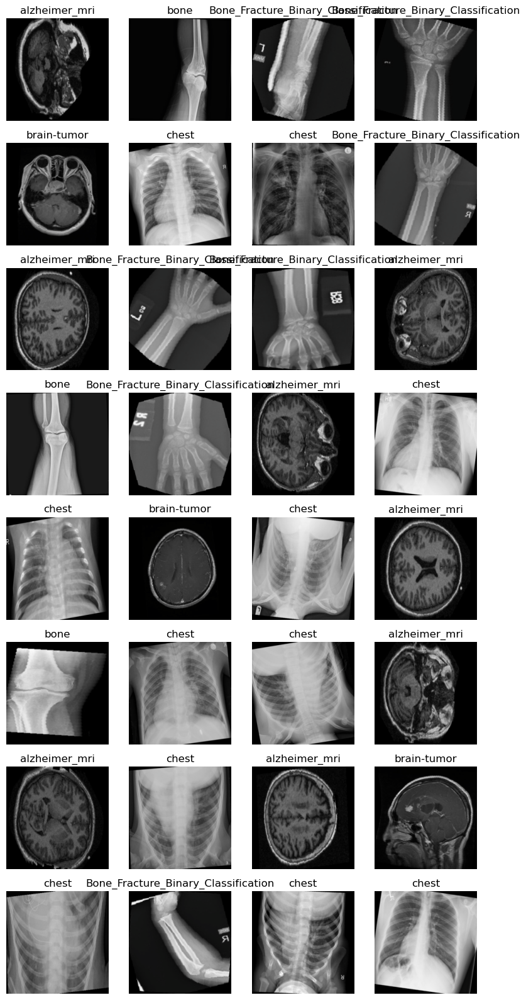

In [11]:
# display sample images with classes
train_iter = iter(train_loader)
images, labels_indices, labels = next(train_iter)

def imshow(input_images, labels_indices,labels):
    label_dict = {"Bone_Fracture_Binary_Classification":"Bone_Fracture_Binary_Classification", "brain-tumor":"brain-tumor", "alzheimer_mri":"alzheimer_mri", "bone":"bone", "chest":"chest"}
    input_images=input_images.numpy().transpose((0,2, 3, 1))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input_images = std * input_images + mean
    input_images = np.clip(input_images, 0, 1)
    fig, axes = plt.subplots(8, 4, figsize=(8, 16))
    for i, ax in enumerate(axes.flat):
        ax.imshow(input_images[i])
        ax.axis('off')
        ax.set_title(label_dict[labels[i]], fontsize=12)
    plt.tight_layout()
    plt.show()


imshow(images, labels_indices,labels)

In [12]:
import os
from PIL import Image
from torch.utils.data import Dataset
import numpy as np

class DatasetWithCorruptionCheck(Dataset):
    def __init__(self, paths, transform=None):
        self.paths = paths
        self.transform = transform
        self.labels = []
        self.valid_paths = []
        self.labels_to_index = {}

        for path in self.paths:
            label = self.get_label(path)
            try:
                # Check if the image can be opened successfully
                img = Image.open(path).convert('RGB')
                self.valid_paths.append(path)
                self.labels.append(label)
            except Exception as e:
                print(f"Skipping corrupted image {path}: {e}")
        
        # Create a mapping from labels to indices
        self.labels_to_index = {label: index for index, label in enumerate(list(set(self.labels)))}
    
    def __getitem__(self, index):
        img_path = self.valid_paths[index]
        img = Image.open(img_path).convert('RGB') 
        label = self.labels[index]
        label_index = self.labels_to_index[label]
        
        if self.transform:
            img = self.transform(img)
        
        return img, label_index, label
    
    def __len__(self):
        return len(self.valid_paths)
    
    def get_label(self, path):
        return os.path.basename(os.path.dirname(path))


In [13]:
# Get unique labels
unique_labels = set(train_dataset.labels)  # Extract unique labels from the training dataset
print("Class Labels:", unique_labels)


Class Labels: {'Bone_Fracture_Binary_Classification', 'brain-tumor', 'bone', 'alzheimer_mri', 'chest'}


In [14]:
class MyModel(nn.Module):
    def __init__(self,num_classes):
        super(MyModel,self).__init__()
        
        self.conv1 = nn.Conv2d(3,32,kernel_size=4,stride=1,padding=0)
        self.bn1 = nn.BatchNorm2d(32)
        
        self.conv2 = nn.Conv2d(32,64,kernel_size=4,stride=1,padding=0)
        self.bn2 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(64,128,kernel_size=4,stride=1,padding=0)
        self.bn3 = nn.BatchNorm2d(128)
        
        self.conv4 = nn.Conv2d(128,128,kernel_size=4,stride=1,padding=0)
        self.bn4 = nn.BatchNorm2d(128)
        
        self.pool = nn.MaxPool2d(kernel_size=3, stride=3)
        self.pool2= nn.MaxPool2d(kernel_size=3, stride=2)
        
        self.fc1 = nn.Linear(6*6*128,512)
        self.fc2 = nn.Linear(512,num_classes)
        
        self.flatten = nn.Flatten()
        self.relu = nn.ReLU() 
        self.dropout = nn.Dropout(0.5)
        
        
        
        
    def forward(self,x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.pool(x)
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.pool(x)
        x = self.relu(self.bn3(self.conv3(x)))
        x = self.pool2(x)
        x = self.relu(self.bn4(self.conv4(x)))
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [15]:
num_classes=5
model = MyModel(num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),lr=0.0002)

In [16]:
def train_epoch():
    model.train()
    total_loss = 0.0 
    total_correct = 0
    total_predictions = 0
    
    for batch_number, (images, labels_indices, labels) in enumerate(train_loader):
        images, labels_indices = images.to(device), labels_indices.to(device)
        
        optimizer.zero_grad()
        
        outputs = model(images)
        loss = criterion(outputs, labels_indices)
        total_loss += loss.item()
        
        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)
        total_predictions += labels_indices.size(0)
        total_correct += (predicted == labels_indices).sum().item()
        
        loss.backward()
        optimizer.step()
        
        if (batch_number and batch_number % 150 == 0):
            c_loss = total_loss / (batch_number + 1)
            accuracy = total_correct / total_predictions
            print(f"Batch {batch_number}/{len(train_loader)}, Loss: {c_loss:0.4f}, Accuracy: {accuracy * 100:.2f}%")
    
    avg_loss = total_loss / len(train_loader)
    avg_accuracy = total_correct / total_predictions
    
    return avg_loss, avg_accuracy

In [17]:
def eval_model():
    model.eval()
    total_loss = 0.0 
    total_correct = 0
    total_predictions = 0
    
    with torch.no_grad():
        for batch_number, (images, labels_indices, labels) in enumerate(val_loader):
            images, labels_indices = images.to(device), labels_indices.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels_indices)
            total_loss += loss.item()
            
            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            total_predictions += labels_indices.size(0)
            total_correct += (predicted == labels_indices).sum().item()
            
    avg_loss = total_loss / len(val_loader)
    avg_accuracy = total_correct / total_predictions
    
    return avg_loss, avg_accuracy

In [18]:
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

In [ ]:
best_score = float("inf")
n_epochs = 10
tolerance = 0

for epoch in range(n_epochs):
    print(f"Epoch {epoch},   ", end="")
    avg_train_loss, train_accuracy = train_epoch()
    avg_eval_loss, eval_accuracy = eval_model()
    
    if avg_eval_loss < best_score:
        best_score = avg_eval_loss
        torch.save(model.state_dict(), f"classify_{epoch+1}")
        tolerance = 0
    else:
        tolerance += 1
        if tolerance >= 8:
            break
            
    train_losses.append(avg_train_loss)
    val_losses.append(avg_eval_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(eval_accuracy)
    
    print(f"Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy * 100:.2f}%")
    print(f"Eval Loss: {avg_eval_loss:.4f}, Eval Accuracy: {eval_accuracy * 100:.2f}%")
    print("#" * 70)

Epoch 0,   Batch 150/1316, Loss: 0.0339, Accuracy: 98.90%
Batch 300/1316, Loss: 0.0262, Accuracy: 99.18%
Batch 450/1316, Loss: 0.0241, Accuracy: 99.24%
Batch 600/1316, Loss: 0.0261, Accuracy: 99.18%
Batch 750/1316, Loss: 0.0242, Accuracy: 99.23%
Batch 900/1316, Loss: 0.0252, Accuracy: 99.19%
Batch 1050/1316, Loss: 0.0245, Accuracy: 99.21%
Batch 1200/1316, Loss: 0.0239, Accuracy: 99.24%


C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Train Loss: 0.0228, Train Accuracy: 99.29%
Eval Loss: 0.0397, Eval Accuracy: 98.52%
######################################################################
Epoch 1,   Batch 150/1316, Loss: 0.0146, Accuracy: 99.57%
Batch 300/1316, Loss: 0.0252, Accuracy: 99.22%
Batch 450/1316, Loss: 0.0230, Accuracy: 99.29%
Batch 600/1316, Loss: 0.0222, Accuracy: 99.32%
Batch 750/1316, Loss: 0.0200, Accuracy: 99.38%
Batch 900/1316, Loss: 0.0192, Accuracy: 99.42%
Batch 1050/1316, Loss: 0.0182, Accuracy: 99.44%
Batch 1200/1316, Loss: 0.0174, Accuracy: 99.46%
Train Loss: 0.0170, Train Accuracy: 99.47%
Eval Loss: 0.0291, Eval Accuracy: 99.29%
######################################################################
Epoch 2,   Batch 150/1316, Loss: 0.0129, Accuracy: 99.61%
Batch 300/1316, Loss: 0.0119, Accuracy: 99.60%
Batch 450/1316, Loss: 0.0121, Accuracy: 99.59%
Batch 600/1316, Loss: 0.0115, Accuracy: 99.62%
Batch 750/1316, Loss: 0.0140, Accuracy: 99.56%
Batch 900/1316, Loss: 0.0140, Accuracy: 99.56%
Batch 10

In [19]:
best_score = float("inf")
n_epochs = 2
tolerance = 0

for epoch in range(n_epochs):
    print(f"Epoch {epoch},   ", end="")
    avg_train_loss, train_accuracy = train_epoch()
    avg_eval_loss, eval_accuracy = eval_model()
    
    if avg_eval_loss < best_score:
        best_score = avg_eval_loss
        torch.save(model.state_dict(), f"class_{epoch+1}")
        tolerance = 0
    else:
        tolerance += 1
        if tolerance >= 8:
            break
            
    train_losses.append(avg_train_loss)
    val_losses.append(avg_eval_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(eval_accuracy)
    
    print(f"Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy * 100:.2f}%")
    print(f"Eval Loss: {avg_eval_loss:.4f}, Eval Accuracy: {eval_accuracy * 100:.2f}%")
    print("#" * 70)

Epoch 0,   Batch 150/1316, Loss: 0.1966, Accuracy: 92.92%
Batch 300/1316, Loss: 0.1356, Accuracy: 95.36%
Batch 450/1316, Loss: 0.1052, Accuracy: 96.48%
Batch 600/1316, Loss: 0.0874, Accuracy: 97.11%
Batch 750/1316, Loss: 0.0763, Accuracy: 97.50%
Batch 900/1316, Loss: 0.0690, Accuracy: 97.76%
Batch 1050/1316, Loss: 0.0631, Accuracy: 97.93%
Batch 1200/1316, Loss: 0.0597, Accuracy: 98.01%


C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Train Loss: 0.0562, Train Accuracy: 98.13%
Eval Loss: 0.0396, Eval Accuracy: 98.73%
######################################################################
Epoch 1,   Batch 150/1316, Loss: 0.0130, Accuracy: 99.63%
Batch 300/1316, Loss: 0.0198, Accuracy: 99.40%
Batch 450/1316, Loss: 0.0216, Accuracy: 99.31%
Batch 600/1316, Loss: 0.0218, Accuracy: 99.31%
Batch 750/1316, Loss: 0.0204, Accuracy: 99.36%
Batch 900/1316, Loss: 0.0199, Accuracy: 99.37%
Batch 1050/1316, Loss: 0.0193, Accuracy: 99.39%
Batch 1200/1316, Loss: 0.0192, Accuracy: 99.39%
Train Loss: 0.0189, Train Accuracy: 99.38%
Eval Loss: 0.0311, Eval Accuracy: 99.04%
######################################################################


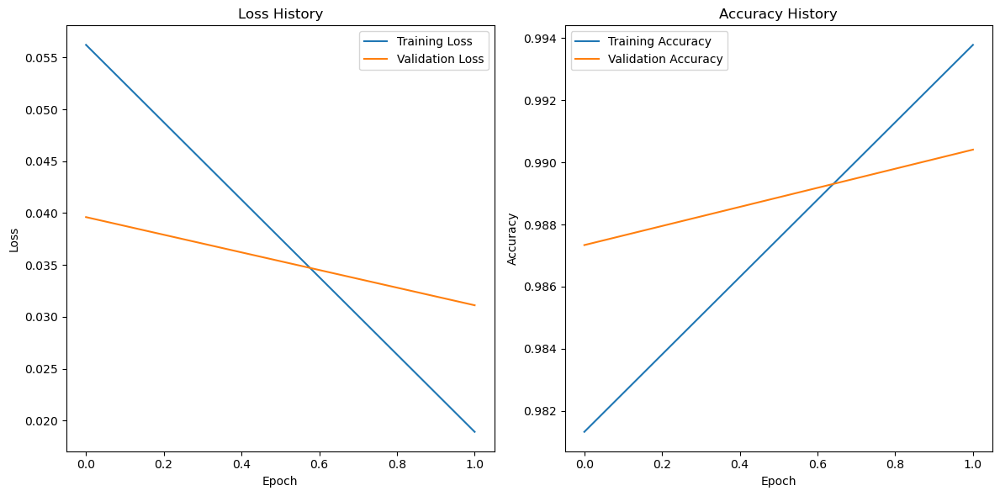

In [20]:
# Visualize training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss History')

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy History')

plt.tight_layout()
plt.show()

In [21]:
models = glob("C:\\Users\\sangeetha\\class_*")
print("Found models:", models)

Found models: ['C:\\Users\\sangeetha\\class_1', 'C:\\Users\\sangeetha\\class_2']


In [23]:

# Extract only numeric model numbers
model_num = [
    int(i.split("_")[-1]) for i in models if i.split("_")[-1].isdigit()
]

if model_num:
    best_model_path = "C:\\Users\\sangeetha\\class_" + str(max(model_num))
    print("Best model path:", best_model_path)
else:
    print("No valid numeric model files found.")

Best model path: C:\Users\sangeetha\class_2


In [24]:
best_model = MyModel(num_classes).to(device)

best_model.load_state_dict(torch.load(best_model_path, map_location=device))

C:\Users\sangeetha\AppData\Local\Temp\ipykernel_14148\1382705795.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load(best_model_path, m

<All keys matched successfully>

In [25]:
def predict(
    model:nn.Module, 
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device) -> np.ndarray:
    model.eval()
    predictions = []
    with torch.inference_mode():
        for batch, (X, y,labels) in enumerate(sample_loader):
            X, y = X.to(device), y.to(device)
            y_pred = model(X) 
            predictions.append(y_pred.cpu().numpy())
        
    return np.vstack(predictions)

In [26]:
best_model_props = predict(best_model, test_loader, device)
best_model_preds = np.argmax(best_model_props, axis=1)
best_model_preds.shape[0]

8313

In [27]:
gen_labels_test_set = [label[1] for label in test_dataset]
len(gen_labels_test_set)

8313

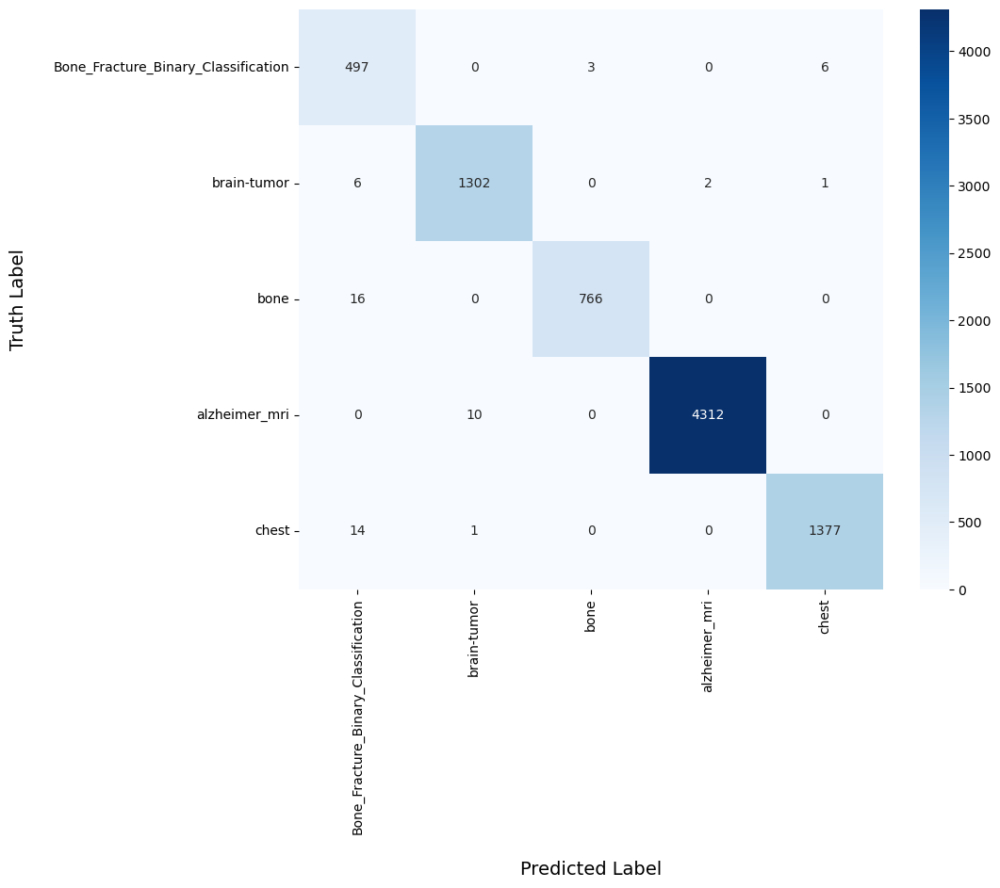

In [28]:
cm = confusion_matrix(gen_labels_test_set, best_model_preds)
labels = set([label[2] for label in test_dataset])
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label', labelpad=20, fontsize=14)
plt.ylabel('Truth Label', labelpad=20, fontsize=14)
plt.show()

In [29]:
print(f"Best Model Test Accuracy: {round(accuracy_score(gen_labels_test_set,best_model_preds)*100,2)}%")


Best Model Test Accuracy: 99.29%


In [28]:
import os
from PIL import Image

# Set your dataset directory here
dataset_path = "C:\\Users\\sangeetha\\classification"

# Valid image extensions
valid_extensions = ('.jpg', '.jpeg', '.png')

# Walk through all folders and subfolders
for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.lower().endswith(valid_extensions):
            file_path = os.path.join(root, file)
            try:
                # Try opening the image
                with Image.open(file_path) as img:
                    img.verify()  # Verify image integrity (does not load it completely)
            except (IOError, SyntaxError) as e:
                print(f"Removing corrupted image: {file_path}")
                os.remove(file_path)  # Delete corrupted image


Removing corrupted image: C:\Users\sangeetha\classification\train\brain-tumor\Tr-gl_0748_1.jpg
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0572_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0574_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0575_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0577_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0578_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0580_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0581_1.png
Removing corrupted image: C:\Users\sangeetha\classification\train\chest\CHNCXR_0582_1.png
